In [1]:
"""nb1_structured_rnas — reproduces the structured-RNA 4-panel figure.

Loads 4 cached CSVs from data/cache/structured_rnas/ and produces one PNG
per system (hc16, tetrahymena_ribozyme, HCV_IRES, V_chol_gly_riboswitch).
All flag values are hardcoded to the canonical paper version.

Run from the repo root:
    python notebooks/nb1_structured_rnas.py

Outputs written to: data/cache/structured_rnas/figures/

To regenerate the cached CSVs (when fits change):
    python notebooks/_regenerate_cache_nb1.py
"""

'nb1_structured_rnas — reproduces the structured-RNA 4-panel figure.\n\nLoads 4 cached CSVs from data/cache/structured_rnas/ and produces one PNG\nper system (hc16, tetrahymena_ribozyme, HCV_IRES, V_chol_gly_riboswitch).\nAll flag values are hardcoded to the canonical paper version.\n\nRun from the repo root:\n    python notebooks/nb1_structured_rnas.py\n\nOutputs written to: data/cache/structured_rnas/figures/\n\nTo regenerate the cached CSVs (when fits change):\n    python notebooks/_regenerate_cache_nb1.py\n'

In [2]:
import argparse
import pathlib
import numpy as np
import pandas as pd
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

def _parse_args():
    parser = argparse.ArgumentParser(description='Plot nb1 structured RNA figures')
    parser.add_argument('--cache-dir', default=None,
                        help='Override cache directory (default: data/cache/structured_rnas)')
    parser.add_argument('--fig-out', default=None,
                        help='Override figures output directory (default: <cache>/figures)')
    args, _ = parser.parse_known_args()
    return args


ARGS = _parse_args()

try:
    REPO = pathlib.Path(__file__).resolve().parents[2]
except NameError:
    _p = pathlib.Path.cwd().resolve()
    REPO = next(p for p in [_p, *_p.parents] if (p / 'merge_rna').is_dir())

CACHE = pathlib.Path(ARGS.cache_dir) if ARGS.cache_dir else REPO / 'data' / 'cache' / 'structured_rnas'
FIG_OUT = pathlib.Path(ARGS.fig_out) if ARGS.fig_out else CACHE / 'figures'
FIG_OUT.mkdir(parents=True, exist_ok=True)


def _show_or_note(path):
    try:
        get_ipython()
        from IPython.display import display, Image
        display(Image(str(path)))
    except NameError:
        print(f"  saved → {path}")

In [3]:
SYSTEMS_WITH_PDB = ['HCV_IRES', 'hc16', 'tetrahymena_ribozyme', 'V_chol_gly_riboswitch']
SYSTEMS_ALL = ['hc16', 'bact_RNaseP_typeA', 'tetrahymena_ribozyme', 'HCV_IRES', 'V_chol_gly_riboswitch']
SUBTITLE_FS = 10
BAR_WIDTH = 0.8
METHOD_ORDER = ['Vienna_MFE', 'Vienna_BPP', 'Deigan_Turner', 'Deigan_Andronescu',
                'MERGE_Turner', 'MERGE_Andronescu']
METHOD_COLORS = {
    'Vienna_MFE': 'lightgreen',
    'Vienna_BPP': 'green',
    'Deigan_Turner': 'orange',
    'Deigan_Andronescu': 'gold',
    'MERGE_Turner': 'blue',
    'MERGE_Andronescu': 'mediumpurple',
}
METHOD_POSITIONS = {m: i for i, m in enumerate(METHOD_ORDER)}
SHORT_NAMES = {
    'HCV_IRES': 'HCV IRES',
    'hc16': 'hc16',
    'tetrahymena_ribozyme': 'Tetrah. rib.',
    'V_chol_gly_riboswitch': 'V. chol. gly rib.',
}
PP_PAIRED_THR = 0.75
PP_UNPAIRED_THR = 0.25

In [4]:
panel_a = pd.read_csv(CACHE / 'panel_a_losses.csv')
panel_b = pd.read_csv(CACHE / 'panel_b_distances.csv')
panel_c = pd.read_csv(CACHE / 'panel_c_r2.csv')
panel_d = pd.read_csv(CACHE / 'panel_d_dots.csv')

In [5]:

def _plot_panel_a(ax, system):
    """CV loss bars per system, with validation folds highlighted gold."""
    x = np.arange(len(SYSTEMS_ALL))
    bar_width = 0.08
    for i, sys_name in enumerate(SYSTEMS_ALL):
        df_sys = panel_a[panel_a['system'] == sys_name].copy()
        losses = df_sys['loss'].values
        is_val = df_sys['is_validation'].values
        colors = ['gold' if v else 'purple' for v in is_val]
        positions = i + np.arange(len(losses)) * bar_width - (len(losses) - 1) * bar_width / 2
        ax.bar(positions, losses, color=colors, edgecolor='k', width=bar_width)

    ax.set_ylabel('Normalised Loss')
    ax.set_title('Loss per system in cross-validation', fontsize=SUBTITLE_FS)
    labels = [s.replace('_', ' ') for s in SYSTEMS_ALL]
    short_labels = [l if len(l) <= 10 else l[:7] + '.' for l in labels]
    ax.set_xticks(x)
    ax.set_xticklabels(short_labels, rotation=17)
    ax.legend(handles=[
        Patch(facecolor='purple', label='Training'),
        Patch(facecolor='gold', label='Test'),
    ])
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.text(0.98, 0.95, 'a', transform=ax.transAxes, fontsize=16, fontweight='bold',
            va='top', ha='right', bbox=dict(boxstyle='round,pad=0.2', facecolor='white',
                                            alpha=0.7, edgecolor='none'))


def _plot_sub_bars(ax, df_sys, method, base_pos, color):
    """Draw sub-bars for one method (multiple sub_id values) centered at base_pos."""
    rows = df_sys[df_sys['method'] == method].sort_values('sub_id')
    n = len(rows)
    if n == 0:
        return
    sub_width = BAR_WIDTH / max(n, 1)
    start = base_pos - BAR_WIDTH / 2
    positions = [start + j * sub_width + sub_width / 2 for j in range(n)]
    ax.bar(positions, rows[rows.columns[-1]].values,  # last numeric col (distance or r2_mean)
           color=color, edgecolor='k', width=sub_width)
    return positions


def _plot_panel_b(ax, system):
    """Frobenius distance bars: 6 methods, sub-bars for multi-fold methods."""
    df_sys = panel_b[panel_b['system'] == system].copy()
    pos_by_method = {}

    for method in METHOD_ORDER:
        pos = METHOD_POSITIONS[method]
        color = METHOD_COLORS[method]
        rows = df_sys[df_sys['method'] == method].sort_values('sub_id')
        n = len(rows)
        if n == 0:
            continue
        sub_width = BAR_WIDTH / max(n, 1)
        start = pos - BAR_WIDTH / 2
        positions = [start + j * sub_width + sub_width / 2 for j in range(n)]
        ax.bar(positions, rows['distance'].values, color=color, edgecolor='k', width=sub_width)
        pos_by_method[method] = positions

    ax.set_ylabel('Frobenius Distance Normalized (↓)')
    ax.set_title(f'Distance from reference for {SHORT_NAMES.get(system, system.replace("_", " "))}',
                 fontsize=SUBTITLE_FS)
    ax.grid(axis='y', linestyle='--')
    ax.tick_params(axis='x', labelbottom=False)
    ax.text(0.98, 0.95, 'b', transform=ax.transAxes, fontsize=16, fontweight='bold',
            va='top', ha='right', bbox=dict(boxstyle='round,pad=0.2', facecolor='white',
                                            alpha=0.7, edgecolor='none'))
    return pos_by_method


def _plot_panel_c(ax, system, pos_by_method):
    """R² bars matching the layout from panel B, with A/C nucleotide markers."""
    df_sys = panel_c[panel_c['system'] == system].copy()

    _r2_marker_kw_A = dict(marker='^', s=15, color='black', zorder=5, linewidths=0.5)
    _r2_marker_kw_C = dict(marker='v', s=15, color='gray', zorder=5, linewidths=0.5)

    for method in METHOD_ORDER:
        pos = METHOD_POSITIONS[method]
        color = METHOD_COLORS[method]
        rows = df_sys[df_sys['method'] == method].sort_values('sub_id')
        n = len(rows)
        if n == 0:
            continue
        sub_width = BAR_WIDTH / max(n, 1)
        start = pos - BAR_WIDTH / 2
        positions = [start + j * sub_width + sub_width / 2 for j in range(n)]
        r2_means = [0.0 if not np.isfinite(v) else v for v in rows['r2_mean'].values]
        ax.bar(positions, r2_means, color=color, edgecolor='k', width=sub_width)
        for xp, ra, rc in zip(positions, rows['r2_A'].values, rows['r2_C'].values):
            if np.isfinite(ra):
                ax.scatter(xp, ra, **_r2_marker_kw_A)
            if np.isfinite(rc):
                ax.scatter(xp, rc, **_r2_marker_kw_C)

    ax.set_title('Correlation between pairing\nprobability and probing data', fontsize=SUBTITLE_FS)
    ax.set_ylabel('Pearson $R^2$ (↑)', fontsize=10)
    ax.set_ylim(0, None)
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.set_xticks([0, 1, 2, 3, 4, 5])
    ax.set_xticklabels(['Vienna\nMFE', 'Vienna\nBPP', 'Deigan\n(Turner)',
                        'Deigan\n(Andr.)', 'MERGE-RNA\n(Turner)', 'MERGE-RNA\n(Andr.)'],
                       rotation=90, fontsize=9)
    ax.legend(handles=[
        Line2D([0], [0], marker='^', color='black', linestyle='None', markersize=6, label='A'),
        Line2D([0], [0], marker='v', color='gray', linestyle='None', markersize=6, label='C'),
    ], loc='upper left', fontsize=6, frameon=True, framealpha=0.85, title='Nucleotide')
    ax.text(0.98, 0.95, 'd', transform=ax.transAxes, fontsize=16, fontweight='bold',
            va='top', ha='right', bbox=dict(boxstyle='round,pad=0.2', facecolor='white',
                                            alpha=0.7, edgecolor='none'))


def _model_pp_to_color(pp_values):
    """Map model pairing probabilities to (R,G,B): blue=paired, yellow=unpaired."""
    return [(1.0 - p, 1.0 - p, p) for p in np.asarray(pp_values)]


def _plot_panel_d_nt(ax, df_dots, nt, x_paired, x_unpaired):
    """Scatter panel for one nucleotide type (A or C)."""
    df_nt = df_dots[df_dots['ref_nt'] == nt]
    df_paired = df_nt[df_nt['pdb_paired'] == True]
    df_unpaired = df_nt[df_nt['pdb_paired'] == False]

    pp_paired = df_paired['model_pp'].values
    mut_paired = df_paired['mut_rate'].values * 100
    strong_dis_paired = pp_paired < PP_UNPAIRED_THR

    pp_unpaired = df_unpaired['model_pp'].values
    mut_unpaired = df_unpaired['mut_rate'].values * 100
    strong_dis_unpaired = pp_unpaired > PP_PAIRED_THR

    colors_paired = _model_pp_to_color(pp_paired)
    colors_unpaired = _model_pp_to_color(pp_unpaired)

    edge_sd = 'firebrick'

    if len(mut_paired) > 0:
        jitter = np.random.uniform(x_paired - 0.3, x_paired + 0.3, len(mut_paired))
        normal = ~strong_dis_paired
        if np.any(normal):
            ax.scatter(jitter[normal], mut_paired[normal],
                       c=[colors_paired[i] for i in range(len(colors_paired)) if normal[i]],
                       alpha=0.8, s=20, edgecolor='black', linewidth=0.5, zorder=3)
        if np.any(strong_dis_paired):
            ax.scatter(jitter[strong_dis_paired], mut_paired[strong_dis_paired],
                       c=[colors_paired[i] for i in range(len(colors_paired)) if strong_dis_paired[i]],
                       alpha=0.9, s=35, edgecolor=edge_sd, linewidth=1.25, zorder=4)

    if len(mut_unpaired) > 0:
        jitter = np.random.uniform(x_unpaired - 0.3, x_unpaired + 0.3, len(mut_unpaired))
        normal = ~strong_dis_unpaired
        if np.any(normal):
            ax.scatter(jitter[normal], mut_unpaired[normal],
                       c=[colors_unpaired[i] for i in range(len(colors_unpaired)) if normal[i]],
                       alpha=0.8, s=20, edgecolor='black', linewidth=0.5, zorder=3)
        if np.any(strong_dis_unpaired):
            ax.scatter(jitter[strong_dis_unpaired], mut_unpaired[strong_dis_unpaired],
                       c=[colors_unpaired[i] for i in range(len(colors_unpaired)) if strong_dis_unpaired[i]],
                       alpha=0.9, s=35, edgecolor=edge_sd, linewidth=1.25, zorder=4)


def _add_xaxis_dots(ax, x_paired, x_unpaired, color_paired, color_unpaired):
    """Place coloured dots inside 'P( )' / 'U( )' x-tick labels."""
    ax.set_xticks([x_paired, x_unpaired])
    ax.set_xticklabels(['P( )', 'U( )'])
    x_shift = 0.09
    y_off = -0.09
    ax.scatter([x_paired + x_shift], [y_off], transform=ax.get_xaxis_transform(),
               s=20, c=[color_paired], edgecolor='black', zorder=6, clip_on=False)
    ax.scatter([x_unpaired + x_shift], [y_off], transform=ax.get_xaxis_transform(),
               s=20, c=[color_unpaired], edgecolor='black', zorder=6, clip_on=False)

Plotting HCV_IRES...


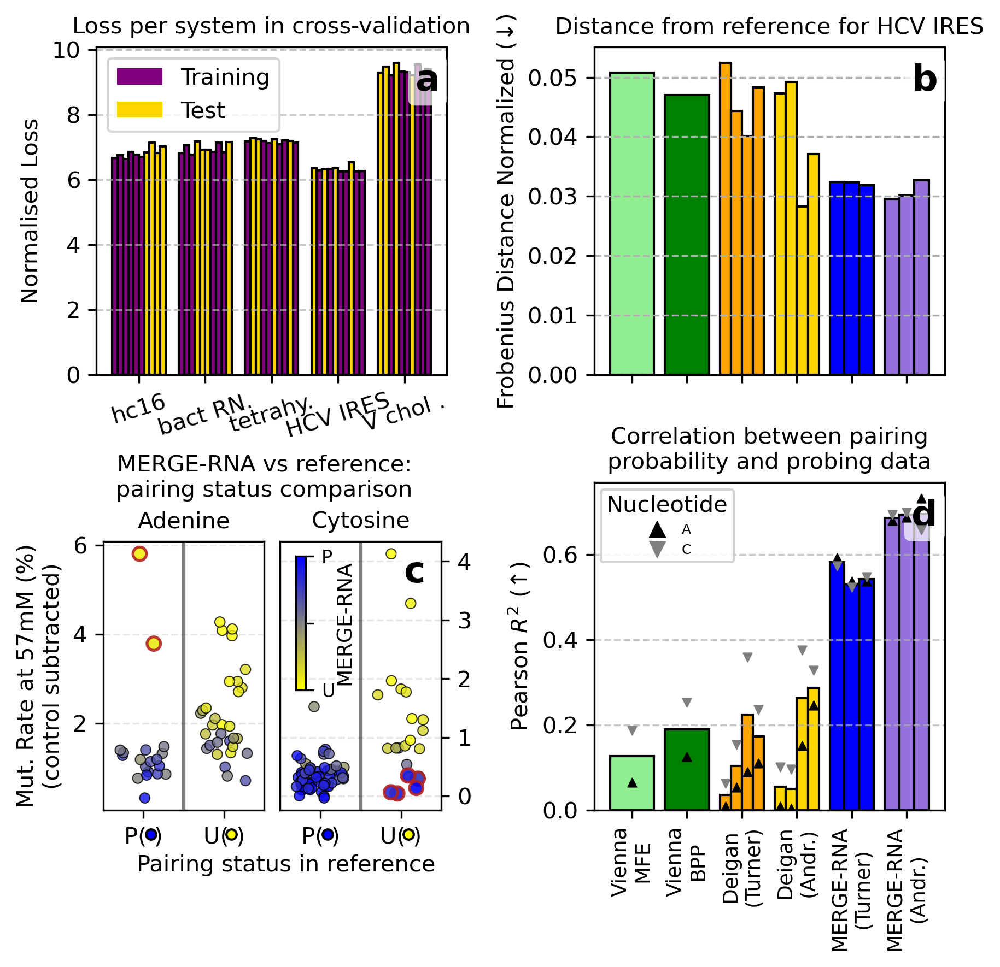

  saved: /Users/giuseppesacco/uni/MERGE-RNA/data/cache/structured_rnas/figures/HCV_IRES.png
Plotting hc16...


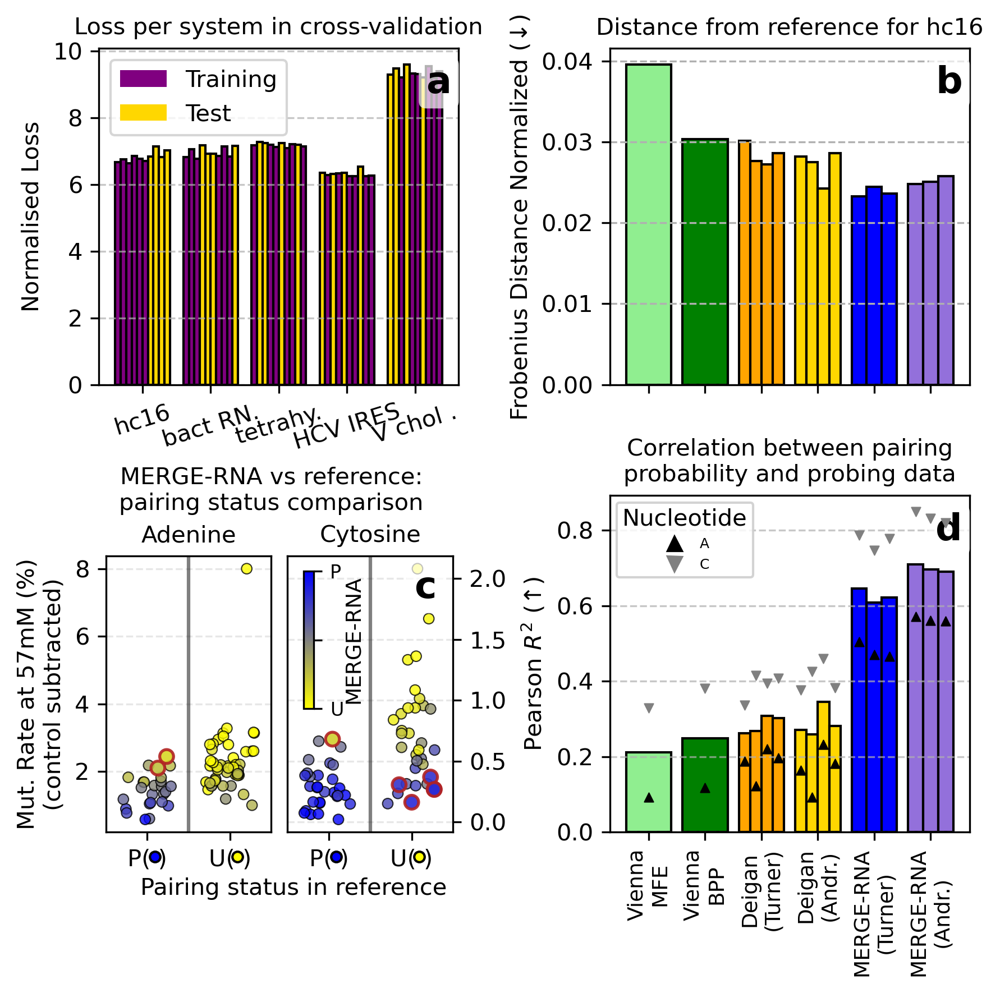

  saved: /Users/giuseppesacco/uni/MERGE-RNA/data/cache/structured_rnas/figures/hc16.png
Plotting tetrahymena_ribozyme...


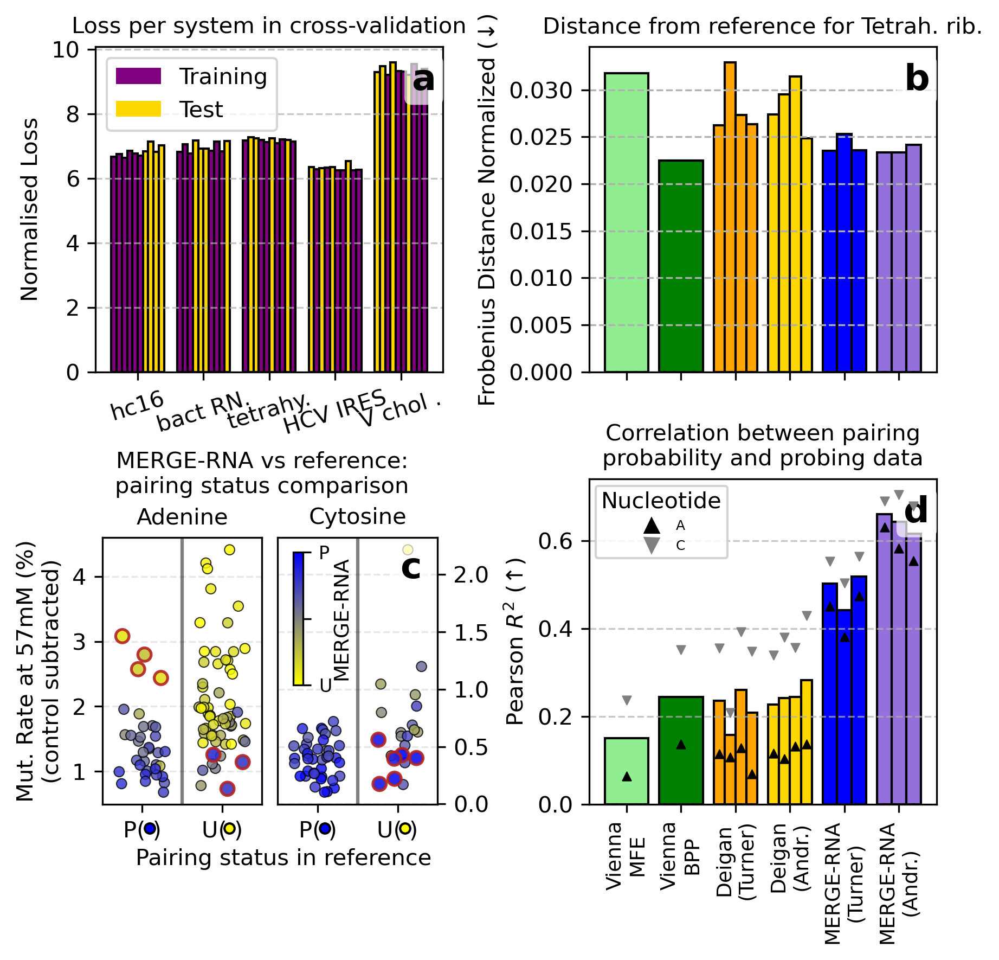

  saved: /Users/giuseppesacco/uni/MERGE-RNA/data/cache/structured_rnas/figures/tetrahymena_ribozyme.png
Plotting V_chol_gly_riboswitch...


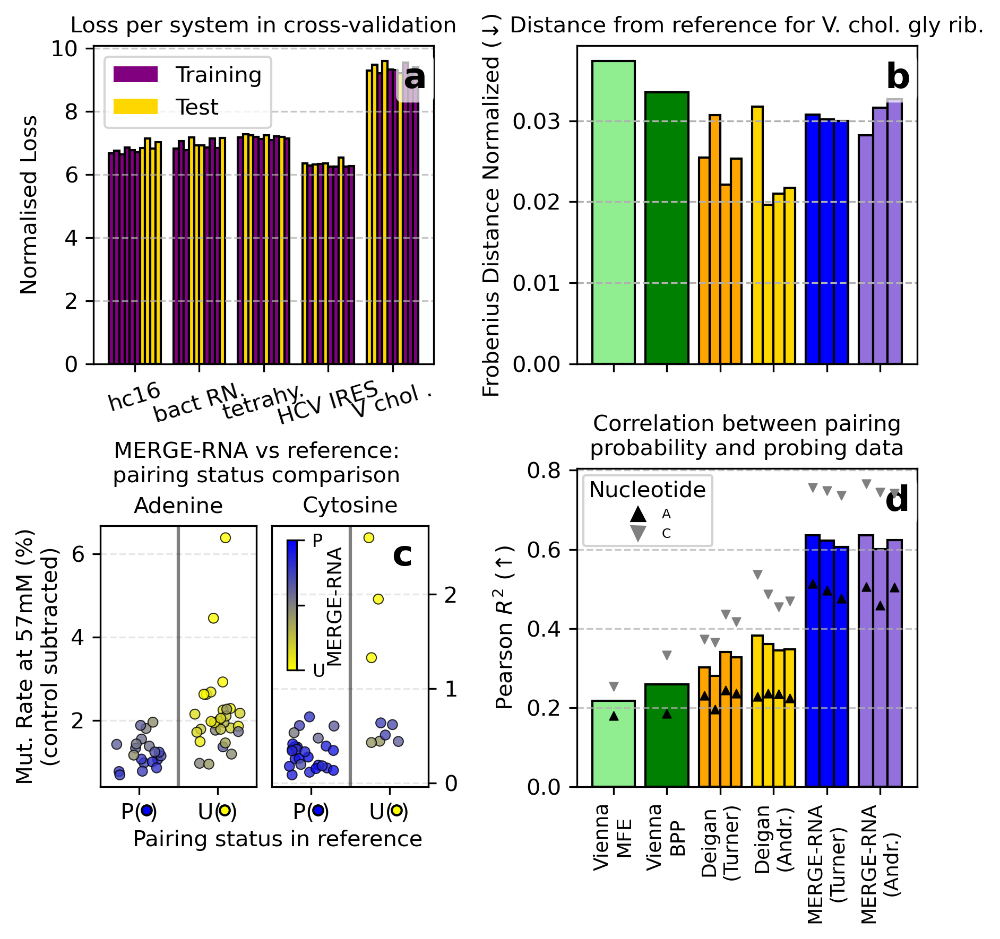

  saved: /Users/giuseppesacco/uni/MERGE-RNA/data/cache/structured_rnas/figures/V_chol_gly_riboswitch.png

Done. 4 figures written to /Users/giuseppesacco/uni/MERGE-RNA/data/cache/structured_rnas/figures


In [6]:

color_blue = (0.0, 0.0, 1.0)
color_yellow = (1.0, 1.0, 0.0)

for system in SYSTEMS_WITH_PDB:
    print(f"Plotting {system}...")
    np.random.seed(0)  # reproducible jitter

    fig = plt.figure(figsize=(6, 6), dpi=300)

    ax1 = plt.subplot(2, 2, 1)
    _plot_panel_a(ax1, system)

    ax2 = plt.subplot(2, 2, 2)
    pos_by_method = _plot_panel_b(ax2, system)

    ax3 = plt.subplot(2, 2, 4, sharex=ax2)
    _plot_panel_c(ax3, system, pos_by_method)

    ax4 = plt.subplot(2, 4, 5)
    ax4_right = plt.subplot(2, 4, 6)

    df_sys_d = panel_d[panel_d['system'] == system]

    _plot_panel_d_nt(ax4, df_sys_d, 'A', x_paired=0, x_unpaired=1)
    ax4.axvline(x=0.5, color='black', linestyle='-', linewidth=1.5, alpha=0.5, zorder=2)
    ax4.set_xlim(-0.5, 1.5)
    ax4.set_title('Adenine', fontsize=SUBTITLE_FS, fontweight='normal')
    ax4.grid(axis='y', alpha=0.3, linestyle='--')
    ax4.set_ylabel('Mut. Rate at 57mM (%)\n(control subtracted)')
    _add_xaxis_dots(ax4, 0, 1, color_blue, color_yellow)

    _plot_panel_d_nt(ax4_right, df_sys_d, 'C', x_paired=0, x_unpaired=1)
    ax4_right.axvline(x=0.5, color='black', linestyle='-', linewidth=1.5, alpha=0.5, zorder=2)
    ax4_right.set_xlim(-0.5, 1.5)
    ax4_right.set_title('Cytosine', fontsize=SUBTITLE_FS, fontweight='normal')
    ax4_right.grid(axis='y', alpha=0.3, linestyle='--')
    ax4_right.yaxis.tick_right()
    ax4_right.yaxis.set_label_position('right')
    _add_xaxis_dots(ax4_right, 0, 1, color_blue, color_yellow)
    ax4_right.text(0.9, 0.95, 'c', transform=ax4_right.transAxes, fontsize=16,
                   fontweight='bold', va='top', ha='right',
                   bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.7, edgecolor='none'))

    plt.tight_layout()
    plt.subplots_adjust(hspace=0.33, wspace=0.42)

    # Reposition panel D sub-axes to touch and trim height
    pos_left = ax4.get_position()
    pos_right = ax4_right.get_position()
    shift_left = 0.03
    new_x0 = pos_right.x0 - pos_right.width - shift_left
    new_height = pos_left.height * 0.82
    new_y0 = pos_left.y0
    ax4.set_position([new_x0 - 0.032, new_y0, pos_right.width, new_height])
    ax4_right.set_position([pos_right.x0 - 0.016 - shift_left, new_y0, pos_right.width, new_height])

    # Colorbar for model pairing probability
    values = np.linspace(0, 1, 256)
    cmap_colors = [(1.0 - p, 1.0 - p, p) for p in values]
    cmap = ListedColormap(cmap_colors, name='blue_yellow')
    norm = plt.Normalize(vmin=0, vmax=1)
    cbar_x = pos_right.x0 - shift_left + pos_right.width + 0.02 - 0.138 - 0.046
    cbar_y = new_y0 + new_height * 0.3 + 0.04
    cbar_ax = fig.add_axes([cbar_x, cbar_y, 0.01, new_height * 0.5])
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical')
    cbar.set_label('MERGE-RNA', fontsize=9, rotation=90, labelpad=0)
    cbar.set_ticks([0, 0.5, 1])
    cbar.set_ticklabels(['U', '', 'P'], fontsize=8)

    # Shared xlabel for panel D
    middle_x = (new_x0 + pos_right.x0 + pos_right.width - 0.05) / 2
    xlabel_y = new_y0 - 0.045
    fig.text(middle_x, xlabel_y, 'Pairing status in reference', ha='center', va='top', fontsize=10)

    # Common title above panel D (positioned above left sub-axis)
    ax4.text(1.0, 1.15, 'MERGE-RNA vs reference:\npairing status comparison',
             ha='center', va='bottom', fontsize=SUBTITLE_FS, transform=ax4.transAxes)

    out_path = FIG_OUT / f'{system}.png'
    plt.savefig(out_path, dpi=300, bbox_inches='tight')
    plt.close('all')
    _show_or_note(out_path)
    print(f"  saved: {out_path}")

print(f"\nDone. {len(SYSTEMS_WITH_PDB)} figures written to {FIG_OUT}")


Plotting soft-constraints sweep figures...


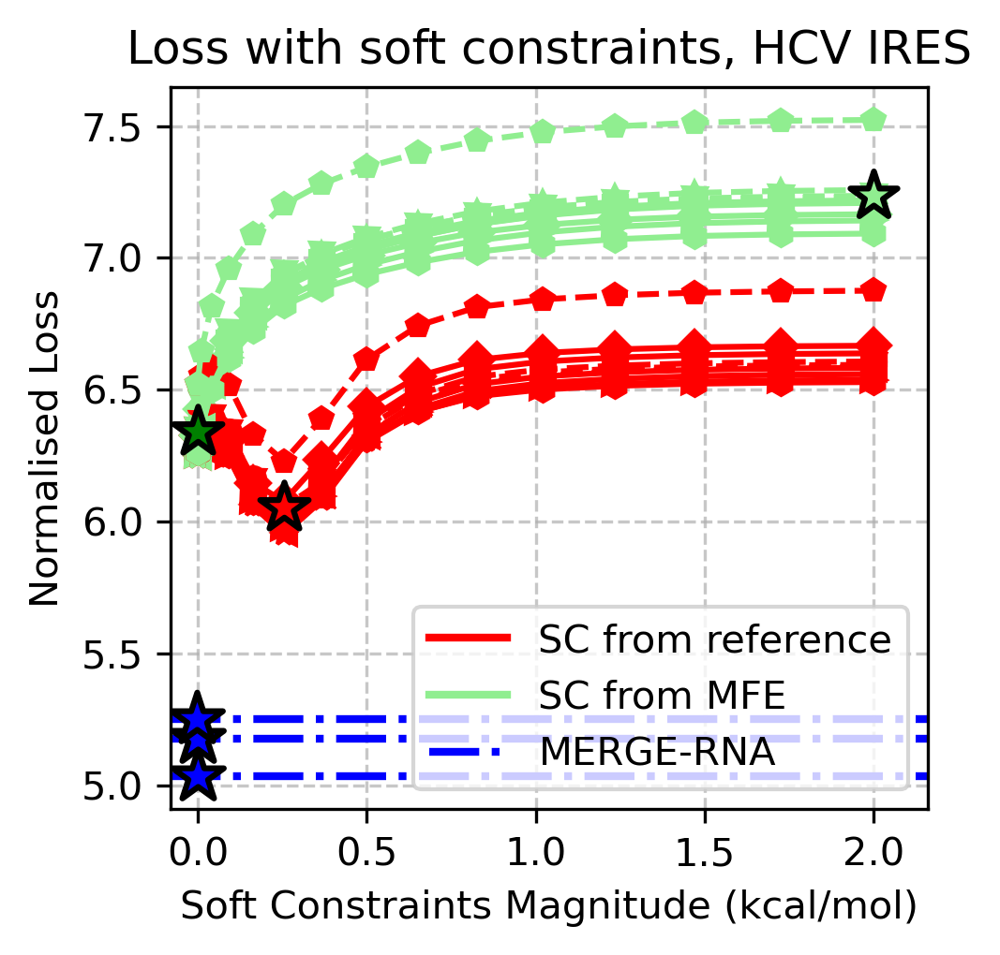

  saved: /Users/giuseppesacco/uni/MERGE-RNA/data/cache/structured_rnas/figures/HCV_IRES_sc_sweep.png


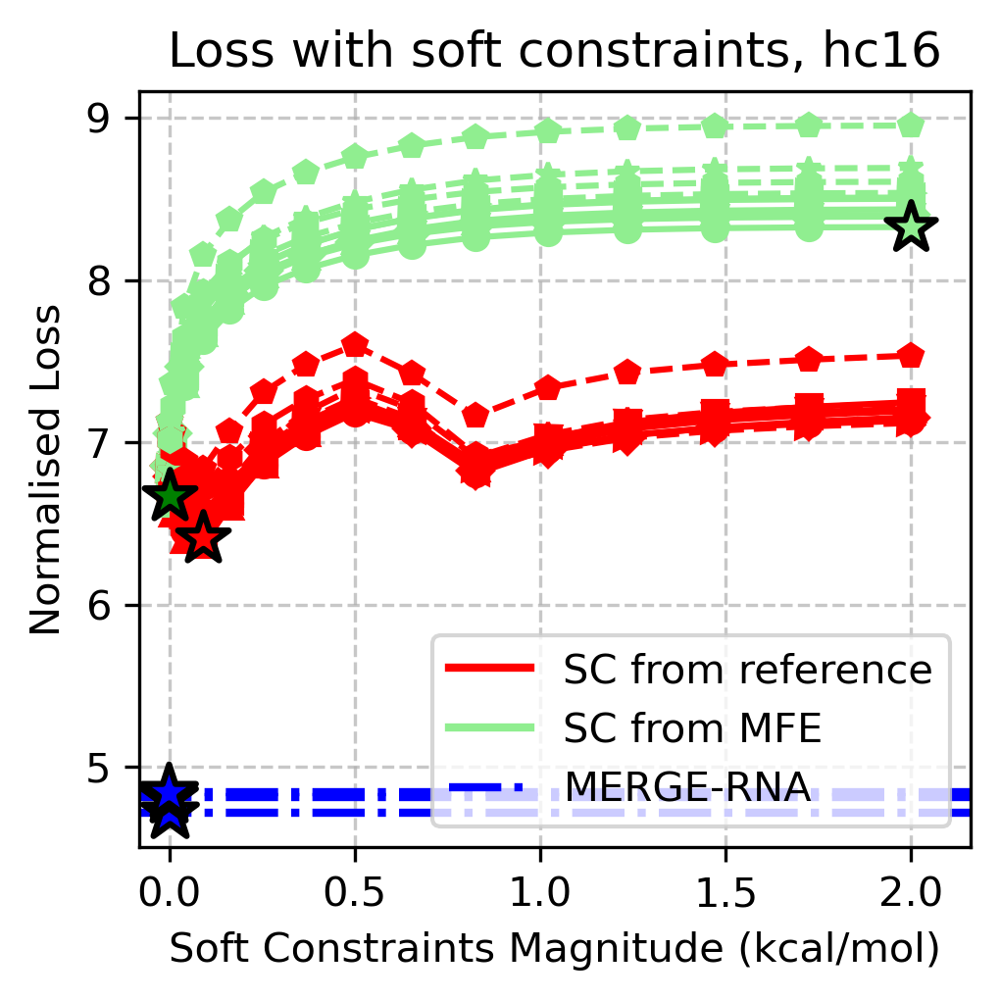

  saved: /Users/giuseppesacco/uni/MERGE-RNA/data/cache/structured_rnas/figures/hc16_sc_sweep.png


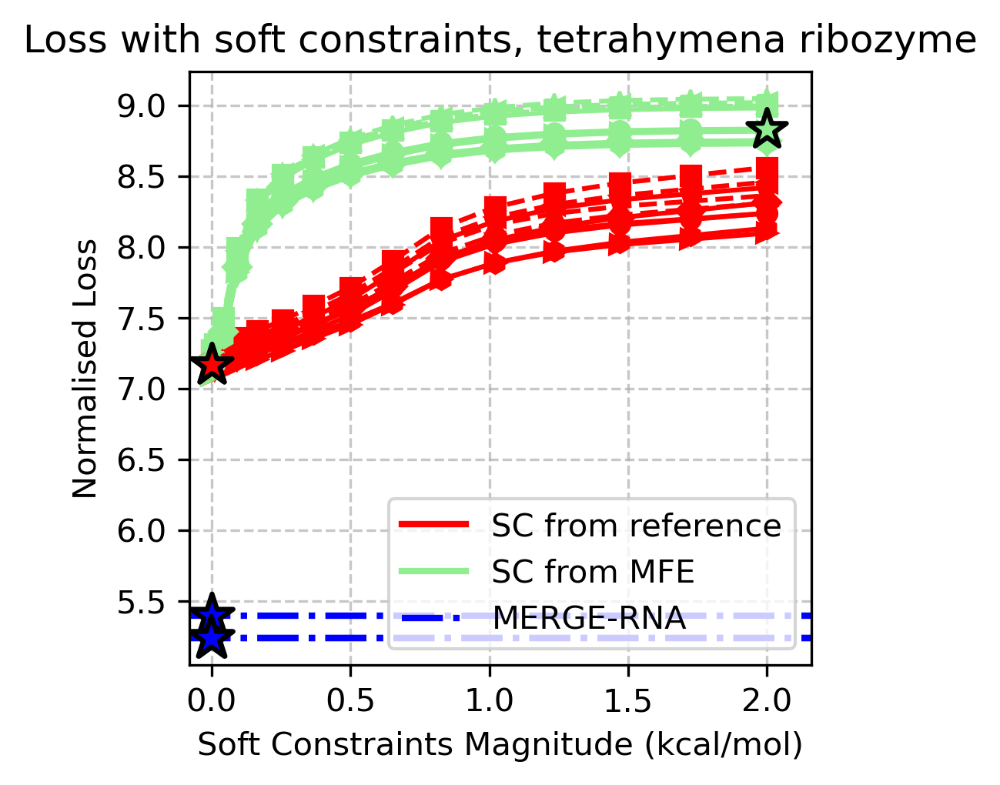

  saved: /Users/giuseppesacco/uni/MERGE-RNA/data/cache/structured_rnas/figures/tetrahymena_ribozyme_sc_sweep.png


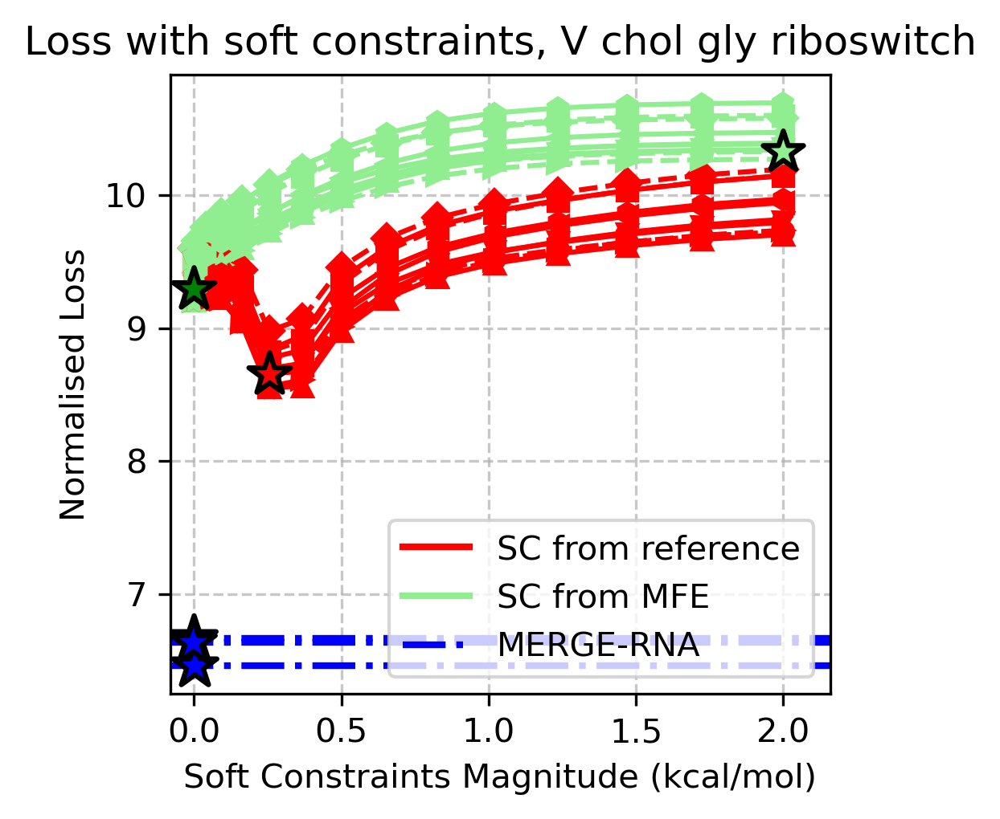

  saved: /Users/giuseppesacco/uni/MERGE-RNA/data/cache/structured_rnas/figures/V_chol_gly_riboswitch_sc_sweep.png
Done.


In [7]:
SC_CACHE = CACHE / 'sc_sweep'
MARKERS = ['o', 's', '^', 'D', 'v', '<', '>', 'p', '*', 'h']

print("\nPlotting soft-constraints sweep figures...")
for system in SYSTEMS_WITH_PDB:
    npz_path = SC_CACHE / f'{system}_results.npz'
    if not npz_path.exists():
        print(f"  SKIP {system}: {npz_path} not found")
        continue

    d = np.load(npz_path, allow_pickle=True)
    model_fit_losses = d['model_fit_losses']
    lambdas_magnitude = d['lambdas_magnitude']
    all_losses = d['all_losses'].item()

    fig, ax = plt.subplots(figsize=(3.5, 3.5), dpi=300)

    marker_style = {
        'column1': dict(marker='*', s=160, facecolors='lightgreen', edgecolors='k', linewidths=1.5, zorder=7),
        'column2': dict(marker='*', s=170, facecolors='green',      edgecolors='k', linewidths=1.5, zorder=7),
        'column3': dict(marker='*', s=170, facecolors='red',        edgecolors='k', linewidths=1.5, zorder=7),
        'column4': dict(marker='*', s=190, facecolors='blue',       edgecolors='k', linewidths=1.5, zorder=7),
    }
    column_points = {'column1': [], 'column2': [], 'column3': [], 'column4': []}

    base_step = max(lambdas_magnitude[1] - lambdas_magnitude[0], 1e-3) if len(lambdas_magnitude) > 1 else 0.05
    base_left = lambdas_magnitude[0] + base_step * 0.1

    for idx, loss in enumerate(model_fit_losses):
        x_pos = max(base_left - idx * base_step * 0.15, base_left - base_step * 0.4)
        column_points['column4'].append((x_pos, loss))
        ax.axhline(y=loss, color='blue', linestyle='-.', lw=2)

    for key, losses in all_losses.items():
        structure, set_i, is_training_str = key.split('_')
        set_i_params = int(set_i)
        marker = MARKERS[set_i_params % len(MARKERS)]
        color = 'red' if structure == 'pdb1D' else 'lightgreen'
        ls = '-' if is_training_str.lower() == 'true' else '--'
        ax.plot(lambdas_magnitude, losses, color=color, linestyle=ls,
                marker=marker, markersize=6, alpha=1)

        if set_i_params != 0:
            continue
        if structure == 'pdb1D':
            column_points['column2'] = [(lambdas_magnitude[0], losses[0])]
            column_points['column3'] = [(lambdas_magnitude[int(np.argmin(losses))],
                                         losses[int(np.argmin(losses))])]
        elif structure == 'mfe1D':
            column_points['column1'] = [(lambdas_magnitude[-1], losses[-1])]

    for column, points in column_points.items():
        for point in points:
            ax.scatter(point[0], point[1], **marker_style[column])

    span = max(lambdas_magnitude[-1] - lambdas_magnitude[0], 1.0)
    pad = max(span * 0.08, 0.1)
    left_bound = lambdas_magnitude[0] + max(base_step * 0.2, 0.02)
    ax.set_xlim(left_bound - 0.1, lambdas_magnitude[-1] + pad)
    ax.set_xlabel('Soft Constraints Magnitude (kcal/mol)')
    ax.set_ylabel('Normalised Loss')
    ax.set_title(f'Loss with soft constraints, {system.replace("_", " ")}')
    ax.legend(handles=[
        Line2D([0], [0], color='red',        lw=2, label='SC from reference'),
        Line2D([0], [0], color='lightgreen',  lw=2, label='SC from MFE'),
        Line2D([0], [0], color='blue', linestyle='-.', lw=2, label='MERGE-RNA'),
    ], loc='lower right')
    ax.grid(linestyle='--', alpha=0.7)
    plt.tight_layout()

    out_path = FIG_OUT / f'{system}_sc_sweep.png'
    plt.savefig(out_path, dpi=300, bbox_inches='tight')
    plt.close('all')
    _show_or_note(out_path)
    print(f"  saved: {out_path}")

print("Done.")


Plotting arcplots...


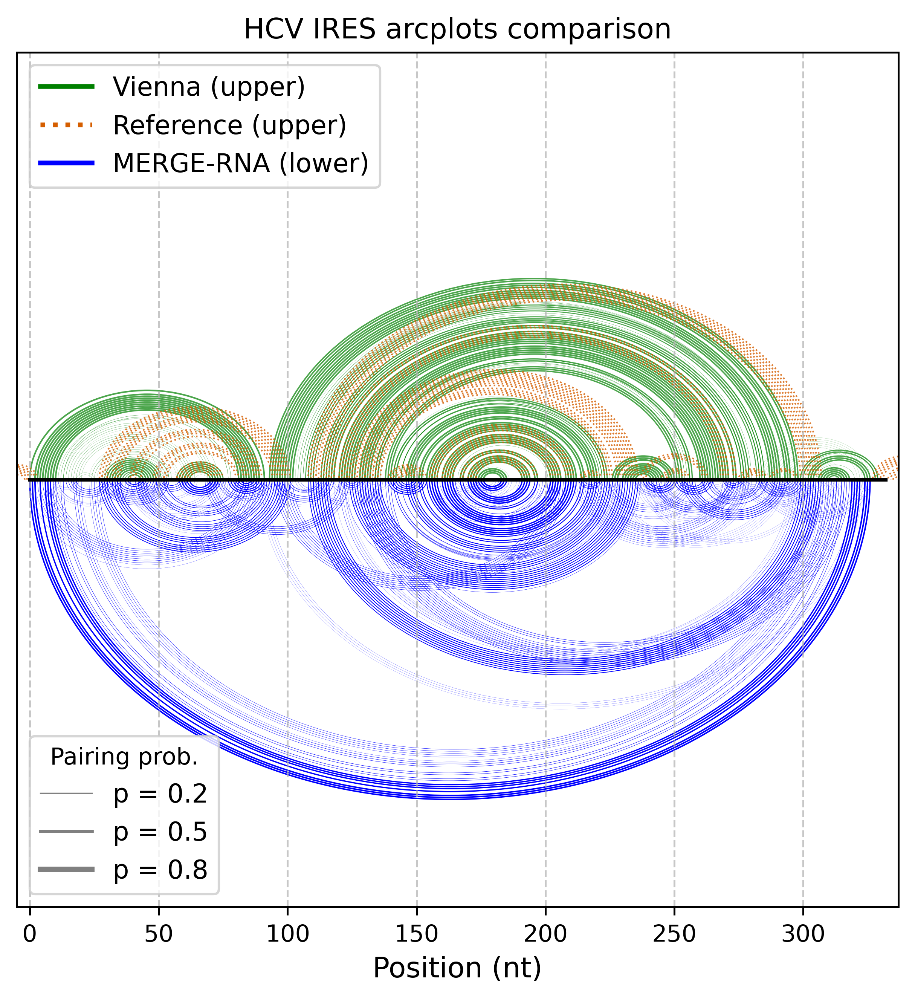

  saved: /Users/giuseppesacco/uni/MERGE-RNA/data/cache/structured_rnas/figures/HCV_IRES_arcplot.png


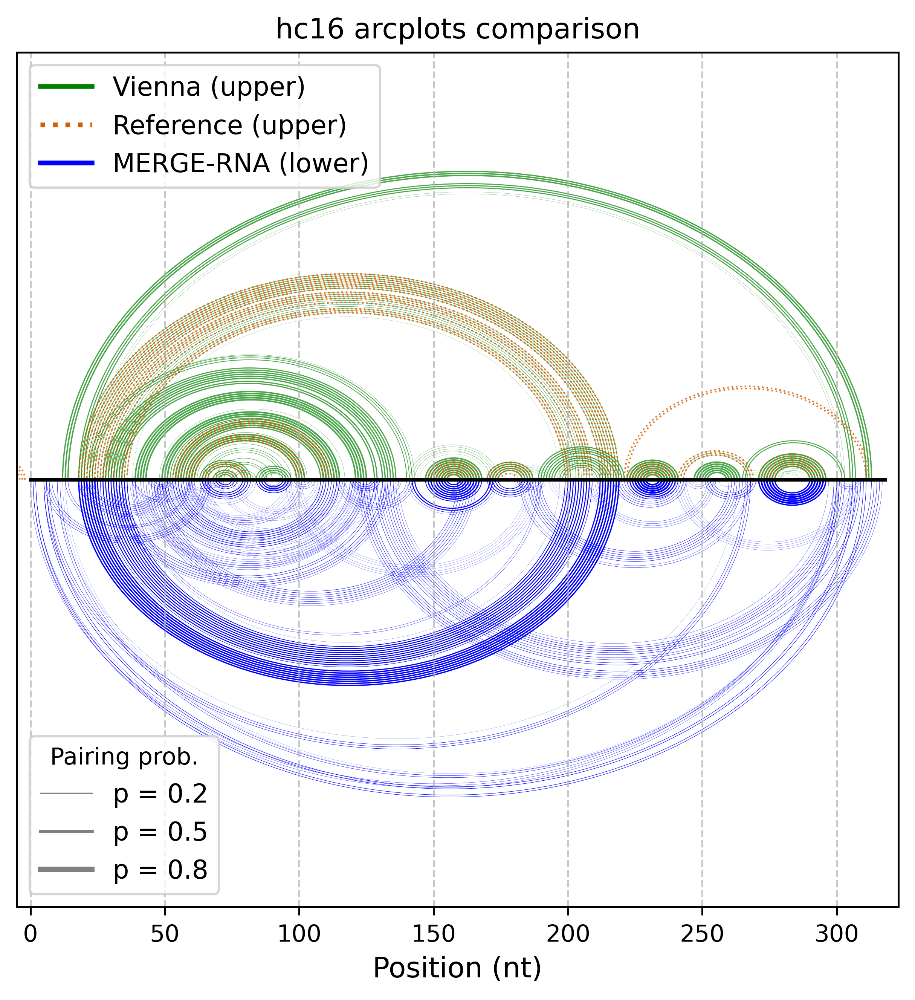

  saved: /Users/giuseppesacco/uni/MERGE-RNA/data/cache/structured_rnas/figures/hc16_arcplot.png


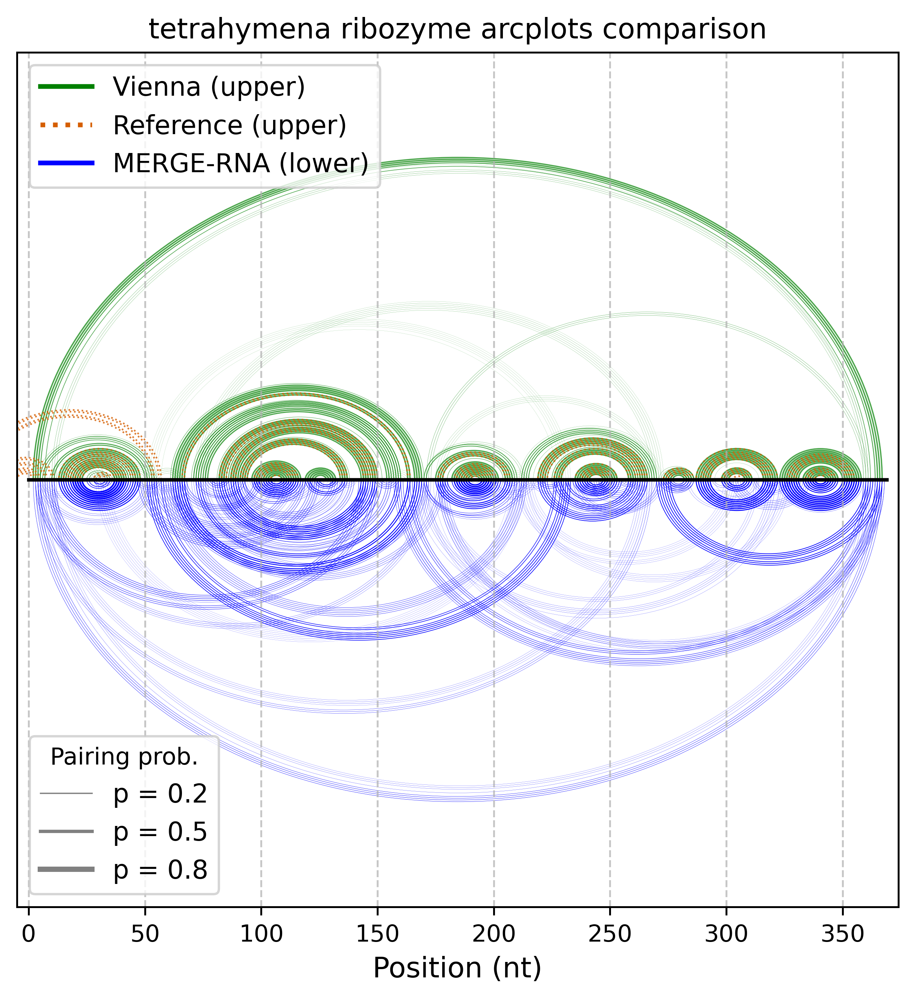

  saved: /Users/giuseppesacco/uni/MERGE-RNA/data/cache/structured_rnas/figures/tetrahymena_ribozyme_arcplot.png


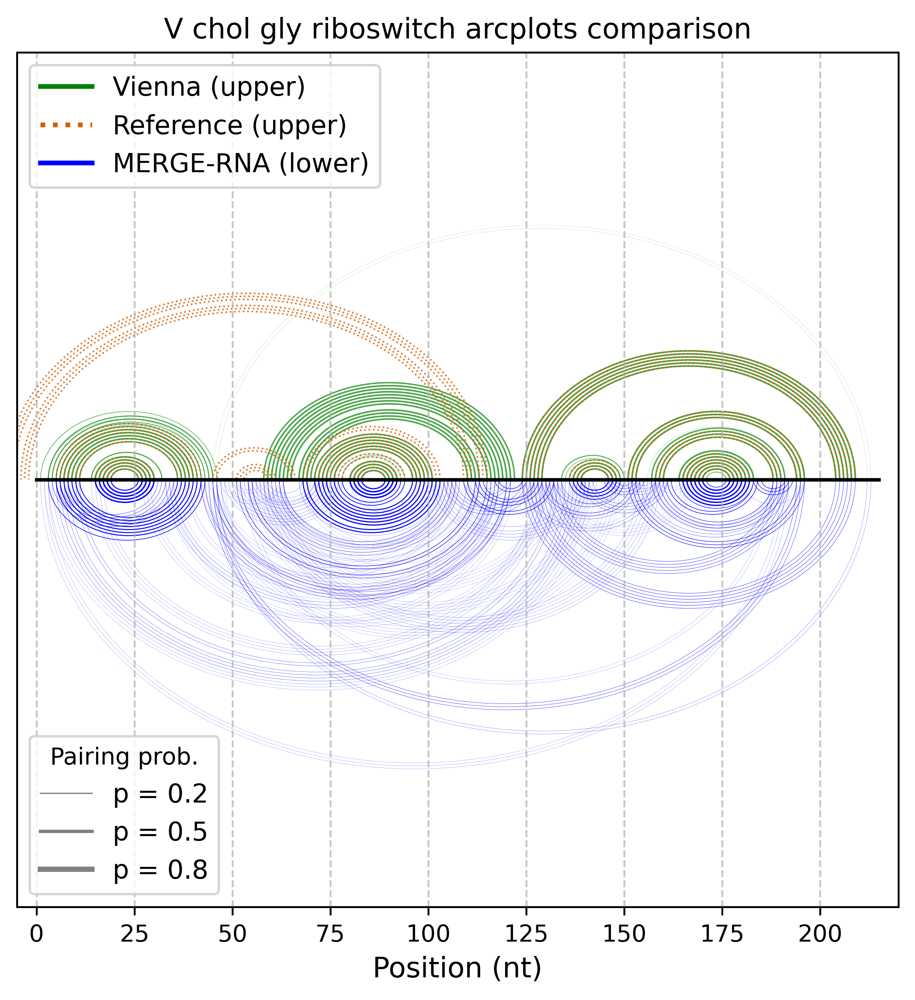

  saved: /Users/giuseppesacco/uni/MERGE-RNA/data/cache/structured_rnas/figures/V_chol_gly_riboswitch_arcplot.png
Done.


In [8]:
ARCPLOT_DIR = CACHE / 'arcplot_bpps'
ARC_THRESHOLD = 0.05
ARC_MAX_LW = 0.7
ARC_COLORS = {
    'vienna': 'green',
    'reference': '#D55E00',
    'merge': 'blue',
}

def _draw_arcs(ax, bpp, n, theta1, theta2, color, alpha, offset=0):
    """Draw arcs for all pairs in bpp above threshold, fixed color, lw ~ prob."""
    for i in range(n):
        for j in range(i + 1, n):
            prob = bpp[i, j]
            if prob > ARC_THRESHOLD:
                center_x = (i + j) / 2.0 + offset
                width = j - i
                height = width * 0.8
                ax.add_patch(plt.matplotlib.patches.Arc(
                    xy=(center_x, 0), width=width, height=height,
                    angle=0, theta1=theta1, theta2=theta2,
                    edgecolor=color, linewidth=ARC_MAX_LW * prob,
                    fill=False, alpha=alpha))

print("\nPlotting arcplots...")
for system in SYSTEMS_WITH_PDB:
    npz_path = ARCPLOT_DIR / f'{system}.npz'
    if not npz_path.exists():
        print(f"  SKIP {system}: {npz_path} not found")
        continue

    d = np.load(npz_path, allow_pickle=True)
    bpp_vienna = d['bpp_vienna']
    bpp_model = d['bpp_model']
    bpp_pdb_full = d['bpp_pdb_full']
    df_start_idx = int(d['df_start_idx'])
    n_total = int(d['n_total'])
    n_full = int(d['bpp_pdb_full'].shape[0])

    fig, ax = plt.subplots(1, 1, figsize=(5.5, 6), dpi=450)

    ax.plot([0, n_total], [0, 0], 'k-', linewidth=1.5)

    # Vienna BPP — upper arcs, lightgreen
    _draw_arcs(ax, bpp_vienna, n_total, theta1=0, theta2=180,
               color=ARC_COLORS['vienna'], alpha=0.7)

    # PDB reference — upper arcs, red dashed
    for i in range(n_full):
        for j in range(i + 1, n_full):
            prob = bpp_pdb_full[i, j]
            if prob > ARC_THRESHOLD:
                center_x = (i + j) / 2.0 - df_start_idx
                width = j - i
                height = width * 0.8
                ax.add_patch(plt.matplotlib.patches.Arc(
                    xy=(center_x, 0), width=width, height=height,
                    angle=0, theta1=0, theta2=180,
                    edgecolor=ARC_COLORS['reference'], linewidth=ARC_MAX_LW * prob,
                    linestyle=':', fill=False, alpha=0.8))

    # MERGE-RNA BPP — lower arcs, blue
    _draw_arcs(ax, bpp_model, n_total, theta1=180, theta2=360,
               color=ARC_COLORS['merge'], alpha=1.0)

    ax.set_ylim(-n_total / 2 * 1.05, n_total / 2 * 1.05)
    ax.set_xlim(-5, n_total + 5)
    ax.set_xlabel('Position (nt)', fontsize=12)
    ax.set_title(f'{system.replace("_", " ")} arcplots comparison')
    ax.set_yticks([])
    ax.grid(axis='x', linestyle='--', alpha=0.7)

    prob_handles = [Line2D([0], [0], color='gray', lw=p * ARC_MAX_LW * 4,
                           label=f'p = {p:.1f}') for p in (0.2, 0.5, 0.8)]
    source_legend = ax.legend(handles=[
        Line2D([0], [0], color=ARC_COLORS['vienna'],    lw=2, label='Vienna (upper)'),
        Line2D([0], [0], color=ARC_COLORS['reference'], lw=2, linestyle=':', label='Reference (upper)'),
        Line2D([0], [0], color=ARC_COLORS['merge'],     lw=2, label='MERGE-RNA (lower)'),
    ], loc='upper left', fontsize=11)
    prob_legend = ax.legend(handles=prob_handles, loc='lower left',
                            title='Pairing prob.', fontsize=11)
    ax.add_artist(source_legend)

    plt.tight_layout()
    out_path = FIG_OUT / f'{system}_arcplot.png'
    plt.savefig(out_path, dpi=450, bbox_inches='tight')
    plt.close('all')
    _show_or_note(out_path)
    print(f"  saved: {out_path}")

print("Done.")